In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import anndata as ad
import numpy as np
import pandas as pd

from rich import print
import os

import scvi

import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import colorcet as cc

from icecream import ic

# Set SVG font type
plt.rcParams["svg.fonttype"] = "none"

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Impor

In [3]:
# from nichevi.spatial_analysis import SpatialAnalysis
from params import setup, niche_setup

In [4]:
sc.set_figure_params(dpi=150, fontsize=12, format="svg")
figure_dir = setup.FIGURES_FOLDER

plots = True

In [ ]:
scvi.settings.seed = 34

Seed set to 34


In [ ]:
data_dir, data_file = setup.DATA_FOLDER, setup.DATA_FILE

data_file_name = os.path.splitext(data_file)[0]
print(data_file_name)

path_to_save = os.path.join("../../niche-VI-experiments/checkpoints", data_file_name)
os.makedirs(path_to_save, exist_ok=True)

xenium_breast_cancer_S1_R1_2

In [7]:
MODEL = "ln_s10_w400_scanvi_lr0.0005_poisson"

In [8]:
# adata = ad.read_h5ad(data_dir + data_file)
adata = ad.read_h5ad(path_to_save + "/xenium_breast_cancer_S1_R1_2_nicheVI.h5ad")

del adata.uns["log1p"]

print(adata)

AnnData object with n_obs × n_vars = 281780 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 
'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sample', 'cell_type', 'n_genes', 
'n_counts', '_scvi_batch', '_scvi_labels', 'cell_type_coarse', 'index', '_scvi_sample'
    var: 'mt'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_coarse_colors', 'neighbors', 'pca', 'simvi_train_mask', 
'simvi_val_mask', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_scVI_MDE', 'X_scanvi', 'X_umap', 'banksy_pc_20_lambda_0.0', 
'banksy_pc_20_lambda_0.2', 'banksy_pc_20_lambda_0.5', 'ln_s10_w400_scanvi_lr0.0005_poisson_X_nicheVI', 
'ln_s20_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'neighborhood_composition', 'niche_distances', 'niche_indexes', 
'qz1_m', 'qz1_m_niche_ct', 'simvi_both', 'simvi_both_08', 'simvi_both_MDE', 'simvi_both_MDE_08', 'simvi_interact', 
'simvi_interact_08', 'simvi_interact_MDE', 'simvi_interact_MDE_08', 'simvi_intrinsic', 'simvi_intrinsic_08', 
'simvi_intrinsic_MDE', 'simvi_intrinsic_MDE_08', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


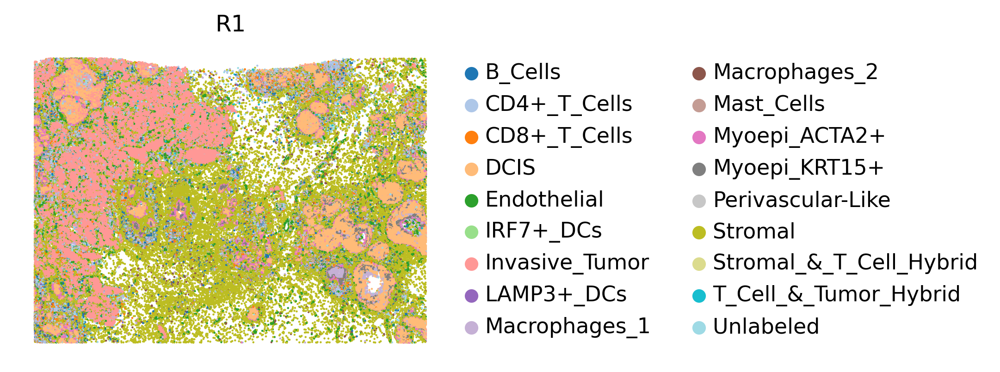

In [10]:
for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    # with plt.rc_context():
    sc.pl.spatial(
        adata[adata.obs[setup.SAMPLE] == sample],
        spot_size=40,
        color=[f"{setup.CELL_TYPE}_coarse"],
        # color=[setup.NICHE],
        # groups = ["CD8+_T_Cells", "DCIS tumor niche"],
        # color=[f"{setup.CELL_TYPE}_coarse"],
        # groups=["DCIS", "CD8+_T_Cells"],
        ncols=1,
        frameon=False,
        title=sample,
        palette="tab20",
        show=False,
    )
    # plt.savefig(f"{figure_dir}spatial_breast_xenium.png", bbox_inches="tight", dpi=1000)
    # plt.savefig(f"{figure_dir}spatial_breast_xenium.svg", bbox_inches="tight", dpi=1000)

In [11]:
# adata_astro.layers["standard_scaled"] = adata_astro.X.copy()
# sc.pp.scale(adata_astro, max_value=None, layer="standard_scaled")

# from sklearn.preprocessing import MinMaxScaler

# adata_astro.layers["min_max_scaled"] = MinMaxScaler().fit_transform(
#     adata_astro.X.toarray()
# )
# adata_not_endo.layers["min_max_scaled"] = MinMaxScaler().fit_transform(
#     adata_not_endo.X.toarray()
# )

# adata.layers["standard_scaled"] = adata.X.copy()
# sc.pp.scale(adata, max_value=None, layer="standard_scaled")

# from sklearn.preprocessing import MinMaxScaler

# adata.layers["min_max_scaled"] = MinMaxScaler().fit_transform(
#     adata.X.toarray()
# )
# adata.layers["min_max_scaled"] = MinMaxScaler().fit_transform(
#     adata.X.toarray()
# )

In [11]:
from sklearn.preprocessing import MinMaxScaler

adata.layers["counts_log1p"] = adata.layers["counts"].copy()
sc.pp.log1p(adata, layer="counts_log1p")

adata.layers["standard_scaled"] = adata.layers["counts_log1p"].copy()
sc.pp.scale(adata, max_value=None, layer="standard_scaled")

adata.layers["min_max_scaled"] = MinMaxScaler().fit_transform(
    adata.layers["counts_log1p"].toarray()
)

adata.layers["min_max_scaled_raw"] = MinMaxScaler().fit_transform(
    adata.layers["counts"].toarray()
)

In [12]:
adata_not_endo = adata[adata.obs[setup.CELL_TYPE] != "Endothelial"].copy()

In [13]:
# adata_astro = ad.read_h5ad(
#     path_to_save + "/xenium_breast_cancer_S1_R1_2_nicheVI_CD8.h5ad"
# )
adata_astro = adata[adata.obs[setup.CELL_TYPE] == "Endothelial"].copy()
# del adata_astro.uns["log1p"]

print(adata_astro)

AnnData object with n_obs × n_vars = 15628 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 
'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sample', 'cell_type', 'n_genes', 
'n_counts', '_scvi_batch', '_scvi_labels', 'cell_type_coarse', 'index', '_scvi_sample'
    var: 'mt', 'mean', 'std'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_coarse_colors', 'neighbors', 'pca', 'simvi_train_mask', 
'simvi_val_mask', 'umap', 'log1p'
    obsm: 'X_pca', 'X_scVI', 'X_scVI_MDE', 'X_scanvi', 'X_umap', 'banksy_pc_20_lambda_0.0', 
'banksy_pc_20_lambda_0.2', 'banksy_pc_20_lambda_0.5', 'ln_s10_w400_scanvi_lr0.0005_poisson_X_nicheVI', 
'ln_s20_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'neighborhood_composition', 'niche_distances', 'niche_indexes', 
'qz1_m', 'qz1_m_niche_ct', 'simvi_both', 'simvi_both_08', 'simvi_both_MDE', 'simvi_both_MDE_08', 'simvi_interact', 
'simvi_interact_08', 'simvi_interact_MDE', 'simvi_interact_MDE_08', 'simvi_intrinsic', 'simvi_intrinsic_08', 
'simvi_intrinsic_MDE', 'simvi_intrinsic_MDE_08', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'counts_log1p', 'standard_scaled', 'min_max_scaled', 'min_max_scaled_raw'
    obsp: 'connectivities', 'distances'

# HOTSPOT

In [14]:
import hotspot

# latent_obsm_key = "scanvi_s10_scanvi_lr0.0001_poisson_X_nicheVI"
# latent_obsm_key = "X_scanvi"
latent_obsm_key = setup.COORDS

adata_astro.layers["counts_csc"] = adata_astro.layers["counts"].tocsc()
hs = hotspot.Hotspot(
    adata_astro,
    layer_key="counts_csc",
    model="danb",
    latent_obsm_key=latent_obsm_key,
    # umi_counts_obs_key="total_counts"
)

hs.create_knn_graph(
    weighted_graph=False,
    n_neighbors=30,
)

hs_results = hs.compute_autocorrelations(jobs=-1)
hs_results.head(15)

adata_astro.uns[f"results_{latent_obsm_key}"] = hs_results.loc[hs_results.FDR < 0.05]

100%|██████████| 313/313 [00:00<00:00, 748.22it/s]


In [15]:
# Select the genes with significant lineage autocorrelation
hs_genes = hs_results.loc[hs_results.FDR < 0.05].sort_values("Z", ascending=False).index

# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=-1)

modules = hs.create_modules(min_gene_threshold=15, core_only=True, fdr_threshold=0.05)

module_scores = hs.calculate_module_scores()

# Convert all column names to strings
module_scores.columns = module_scores.columns.map(str)


hs.results.join(hs.modules)
adata_astro.obsm[f"modules_scores{latent_obsm_key}"] = module_scores
adata_astro.uns[f"results_{latent_obsm_key}"] = hs_results.join(hs.modules).loc[
    hs_results.FDR < 0.05
]

modules.value_counts()

Computing pair-wise local correlation on 279 features...


100%|██████████| 38781/38781 [00:14<00:00, 2657.83it/s]


Computing scores for 6 modules...


100%|██████████| 6/6 [00:00<00:00, 13.47it/s]


Module
 1    67
-1    66
 2    40
 3    40
 6    24
 4    22
 5    20
Name: count, dtype: int64

In [16]:
# Get the maximum score and its column for each row
max_scores = adata_astro.obsm[f"modules_scores{latent_obsm_key}"].max(axis=1)
max_columns = adata_astro.obsm[f"modules_scores{latent_obsm_key}"].idxmax(axis=1)

WEAK_THRESHOLD = 0.5

# Apply the condition: keep the column name if max score > 1, else set it to 'weak'
adata_astro.obs["max_module"] = np.where(
    max_scores > WEAK_THRESHOLD, max_columns, "weak"
)

adata_astro.write_h5ad(path_to_save + "/xenium_breast_cancer_S1_R1_2_nicheVI_CD8.h5ad")

adata_astro.obs["max_module"].value_counts()

max_module
1       4246
2       2405
6       2072
5       2060
3       1983
4       1804
weak    1058
Name: count, dtype: int64

In [17]:
adata_astro.uns[f"results_{latent_obsm_key}"]

,C,Z,Pval,FDR,Module
Gene,,,,,
MYH11,0.214891,116.519510,0.000000,0.000000,4.0
PTGDS,0.201036,109.515387,0.000000,0.000000,5.0
ESM1,0.196705,106.580637,0.000000,0.000000,1.0
CEACAM6,0.254787,105.895305,0.000000,0.000000,6.0
CXCL12,0.172886,104.166578,0.000000,0.000000,4.0
...,...,...,...,...,...
CD80,0.003533,1.873423,0.030505,0.034720,-1.0
RAB30,0.003256,1.762826,0.038965,0.044188,-1.0
TYROBP,0.003347,1.737539,0.041146,0.046494,3.0


In [18]:
module_cols = []
for c in adata_astro.obsm[f"modules_scores{latent_obsm_key}"].columns:
    key = f"Module {c}"
    adata_astro.obs[key] = adata_astro.obsm[f"modules_scores{latent_obsm_key}"][c]
    module_cols.append(key)

In [19]:
adata.obs[f"{setup.CELL_TYPE}_coarse"].value_counts()

cell_type_coarse
Stromal                    79986
Invasive_Tumor             55657
DCIS                       41760
Macrophages_1              19207
Endothelial                15628
CD4+_T_Cells               14365
Myoepi_ACTA2+              13136
CD8+_T_Cells               11885
B_Cells                     8771
Unlabeled                   7580
Myoepi_KRT15+               5504
Macrophages_2               3196
Perivascular-Like           1395
Stromal_&_T_Cell_Hybrid     1150
IRF7+_DCs                    893
T_Cell_&_Tumor_Hybrid        837
LAMP3+_DCs                   504
Mast_Cells                   326
Name: count, dtype: int64

In [20]:
# Step 1: Calculate the global 96th percentile for vmax
global_vmax = adata_astro.obs[module_cols].stack().quantile(0.98)

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


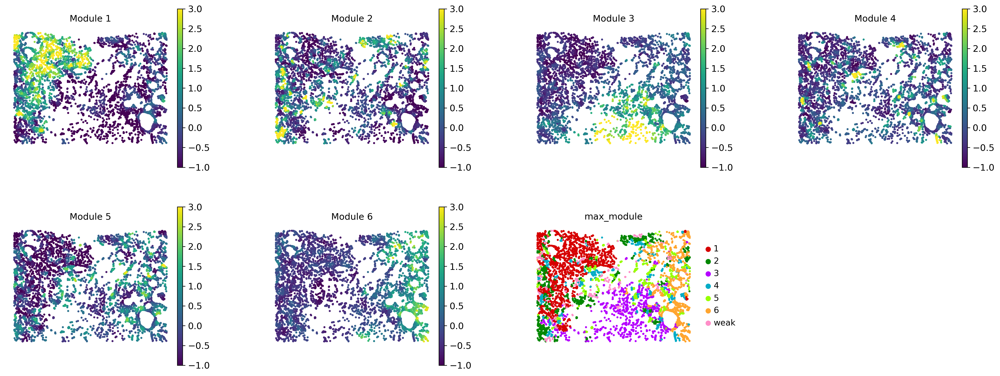

In [21]:
for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata_astro[adata_astro.obs[setup.SAMPLE] == sample],
        spot_size=100,
        color=module_cols + ["max_module"],
        ncols=4,
        frameon=False,
        # title=f"endothelial spatial modules {sample}",
        palette=cc.glasbey_light,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmin=-1,
        vmax=3,
        # vmax=global_vmax,
    )
    # plt.savefig(
    #     f"{figure_dir}endothelial_spatial_modules_xenium.png",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )
    # plt.savefig(
    #     f"{figure_dir}endothelial_spatial_modules_xenium.svg",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


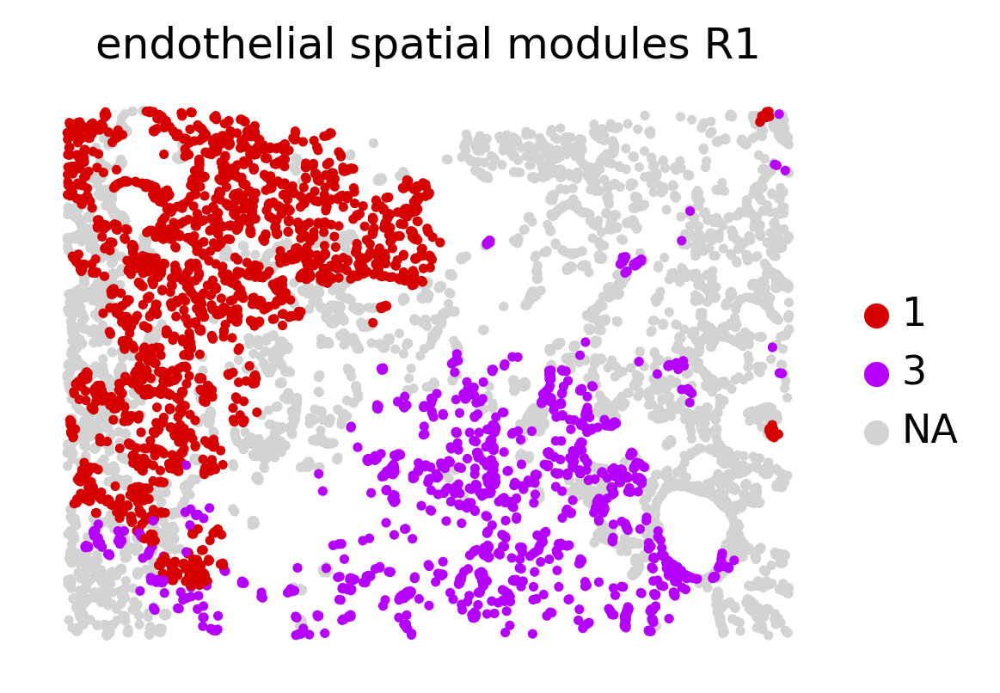

In [22]:
for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata_astro[adata_astro.obs[setup.SAMPLE] == sample],
        spot_size=100,
        color=["max_module"],
        ncols=4,
        frameon=False,
        title=f"endothelial spatial modules {sample}",
        groups=["1", "3"],
        palette=cc.glasbey_light,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmax="p96",
    )
    # plt.savefig(
    #     f"{figure_dir}endothelial_stromal_invasive_xenium.png",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )
    # plt.savefig(
    #     f"{figure_dir}endothelial_stromal_invasive_xenium.svg",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )

In [23]:
# Show the top genes for a module

module = 6

results = hs.results.join(hs.modules)
results = results.loc[results.Module == module]

results.sort_values("Z", ascending=False).head(20)

,C,Z,Pval,FDR,Module
Gene,,,,,
CEACAM6,0.254787,105.895305,0.000000e+00,0.000000e+00,6.0
SFRP1,0.115020,49.670010,0.000000e+00,0.000000e+00,6.0
SFRP4,0.098606,44.182882,0.000000e+00,0.000000e+00,6.0
KRT14,0.070688,34.226893,4.813708e-257,2.511151e-256,6.0
ANKRD30A,0.074284,30.842820,3.496049e-209,1.609211e-208,6.0
TACSTD2,0.055005,25.089807,3.212764e-139,1.169297e-138,6.0
OPRPN,0.048179,23.827075,8.753456e-126,3.044257e-125,6.0
S100A14,0.044946,20.223369,3.048698e-91,9.940025e-91,6.0
MLPH,0.037264,17.315473,1.797793e-67,5.308578e-67,6.0


In [29]:
module_6 = [
    "CEACAM6",
    "SFRP1",
    "SFRP4",
    "KRT14",
    "ANKRD30A",
    "TACSTD2",
    "OPRPN",
    "S100A14",
    "MLPH",
    "KRT15",
    "TFAP2A",
    "AGR3",
    "KRT6B",
    "KRT5",
    "DSP",
    "CLDN4",
    "CDH1",
    "TPD52",
    "KLF5",
    "ESR1",
]

In [30]:
# for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
#     sc.pl.spatial(
#         adata_astro[adata_astro.obs[setup.SAMPLE] == sample],
#         spot_size=100,
#         color=module_6,
#         ncols=5,
#         frameon=False,
#         # title=f"endothelial spatial modules {sample}",
#         palette=cc.glasbey_light,
#         show=False,
#         use_raw=False,
#         wspace=0.4,
#         vmax="p96",
#     )

# nicheDE

In [24]:
if setup.EXPRESSION_MODEL == "scanvi":
    scvivae = scvi.model.SCANVI.load(
        dir_path=path_to_save
        + f"/{setup.EXPRESSION_MODEL}vae_E"
        + str(setup.N_EPOCHS_SCVI)
        + "_"
        + str(setup.LIKELIHOOD)
        + ".pt",
        adata=adata,
        accelerator="cpu",
    )
if setup.EXPRESSION_MODEL == "scvi":
    scvivae = scvi.model.SCVI.load(
        dir_path=path_to_save
        + f"/{setup.EXPRESSION_MODEL}vae_E"
        + str(setup.N_EPOCHS_SCVI)
        + "_"
        + str(setup.LIKELIHOOD)
        + ".pt",
        adata=adata,
        accelerator="cpu",
    )

INFO     File                                                                                                      
         ../../niche-VI-experiments/checkpoints/xenium_breast_cancer_S1_R1_2/scanvivae_E1001_poisson.pt/model.pt   
         already downloaded                                                                                        


In [25]:
import nichevi
# from scvi.external import nicheSCVI
# from nichevi.differential_expression import plot_DE_results, _fdr_de_prediction
# from scvi.external.nichevi.differential_expression import plot_DE_results


model = MODEL

path_to_save_nichevae = (
    path_to_save + "/nichevae_" + model + "_" + str(setup.N_EPOCHS_NICHEVI) + ".pt"
)

nichevae = nichevi.nicheSCVI.load(
    dir_path=path_to_save_nichevae,
    adata=adata,
    accelerator="cpu",
)

INFO     File                                                                                                      
         ../../niche-VI-experiments/checkpoints/xenium_breast_cancer_S1_R1_2/nichevae_ln_s10_w400_scanvi_lr0.0005_p
         oisson_1000.pt/model.pt already downloaded                                                                


In [26]:
adata.obs["max_module"] = "Unknown"
adata.obs.loc[adata.obs[setup.CELL_TYPE] == "Endothelial", "max_module"] = (
    adata_astro.obs["max_module"]
)

In [27]:
adata.obs.max_module.value_counts()

max_module
Unknown    266152
1            4246
2            2405
6            2072
5            2060
3            1983
4            1804
weak         1058
Name: count, dtype: int64

In [35]:
if 'adjusted_A' in adata.uns.keys():
    del adata.uns['adjusted_A']

In [28]:
delta_niches = 0.03
delta_markers = 0.15
DELTA = [delta_niches, delta_markers, delta_niches, delta_niches]
FDR = 0.2
G1 = "1"
G2 = "3"
PSEUDO = 1e-4
N_SAMPLES_DE = 1e5

DE_1_3 = nichevae.differential_expression(
    adata,
    # groupby="kmeans_alpha_5",
    groupby="max_module",
    group1=G1,
    group2=G2,
    batch_correction=False,
    radius=None,
    k_nn=6,
    delta=DELTA,
    niche_mode=True,
    n_samples_overall=N_SAMPLES_DE,
    fdr_target=FDR,
    # weights="importance",
    pseudocounts=PSEUDO,
)


DE_3_1 = nichevae.differential_expression(
    adata,
    # groupby="kmeans_alpha_5",
    groupby="max_module",
    group1=G2,
    group2=G1,
    batch_correction=False,
    radius=None,
    k_nn=6,
    delta=DELTA,
    niche_mode=True,
    n_samples_overall=N_SAMPLES_DE,
    fdr_target=FDR,
    # weights="importance",
    pseudocounts=PSEUDO,
)

Computing adjusted nearest neighbors...

Using all 2 samples
Mean number of neighbors: 2.7 ± 2.1


Computing DE...

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

Running DE for group1_group2

Running DE for group1_neighbors1

Running DE for neighbors1_group2

Running DE for neighbors1_neighbors2

Computing g1 confidence scores...

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__alpha is close to the specified upper bound 1.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 10.0. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Computing DE...

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

Running DE for group1_group2

Running DE for group1_neighbors1

Running DE for neighbors1_group2

Running DE for neighbors1_neighbors2

Computing g1 confidence scores...

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__alpha is close to the specified upper bound 1.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 10.0. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


In [33]:
PROBA_TRES = 0.75
PLOT_MARGIN = 0.2

g1_markers = DE_1_3.gpc.y_
g2_markers = DE_3_1.gpc.y_

## DE_1_3 analysis

In [34]:
DE_1_3.gpc_info()

Training score:  0.9703703703703703

Marginal likelihood:  -18.336883128245294

Kernel:  31.6**2 * RationalQuadratic(alpha=1, length_scale=10)

In [42]:
DE_1_3.g1_g2[(DE_1_3.g1_g2["lfc_median"] > 0) & DE_1_3.g1_g2[f"is_de_fdr_{FDR}"]][
    ["lfc_median", "proba_de", "proba_de_g1_n1"]
].sort_values(by="lfc_median", ascending=False)

,lfc_median,proba_de,proba_de_g1_n1
ESM1,4.245263,0.91136,0.999231
FOXA1,2.284582,0.84976,0.006026
KRT7,1.842508,0.83109,0.001193
PCLAF,1.797462,0.88338,0.018285
TOP2A,1.659897,0.82713,0.150560
SERHL2,1.498258,0.83062,0.000722
CENPF,1.465453,0.84374,0.059387
ABCC11,1.435784,0.80533,0.000326
KDR,1.343443,0.84011,0.999999
SCD,1.342972,0.79933,0.000714


In [40]:
# g1_g3_genes.tolist()

In [41]:
# DE_1_3.gpc.y_train_.loc[g1_g3_genes]

In [42]:
# g1_g3_genes.tolist()

In [43]:
# # Sort the data by the 'lfc_median' column
# sorted_data = DE_1_3.g1_g2.loc[g1_g3_genes].sort_values(by="lfc_median", ascending=False)

# # Set figure size
# plt.figure(figsize=(14, 7))  # Adjust the width and height as needed

# # Plot using Seaborn
# sns.scatterplot(
#     x=sorted_data.index,         # Use the sorted index for the x-axis
#     y=sorted_data["lfc_median"], # Use the sorted column for the y-axis
#     marker="o",
# )

# # Add plot labels and rotate x-ticks
# # plt.title("Column vs. I")
# plt.xlabel("Gene")
# plt.ylabel("Median LFC")
# plt.xticks(rotation=90)  # Rotate x-tick labels by 90 degrees
# # plt.grid(True)

# # Show the plot
# plt.show()

In [38]:
DE_1_3.g1_g2.loc[g1_g3_genes]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.2,comparison,group1,group2,proba_de_g1_n1
SQLE,0.91597,0.08403,2.388810,0.002630,0.001342,0.0001,0.03,0.998890,1.032800,0.679550,...,0.261724,0.322421,0.194150,25.423965,12.833387,True,1 vs 3,1,3,0.035243
ESM1,0.91143,0.08857,2.331221,0.008479,0.000955,0.0001,0.03,4.773177,5.252082,3.195831,...,0.135653,0.445596,0.058497,95.310112,7.450181,True,1 vs 3,1,3,0.941640
CCDC6,0.88899,0.11101,2.080466,0.005408,0.003636,0.0001,0.03,0.556880,0.554310,0.434477,...,0.716596,0.528026,0.454866,52.077980,35.123730,True,1 vs 3,1,3,0.013925
PTRHD1,0.88727,0.11273,2.063154,0.001478,0.000902,0.0001,0.03,0.716732,0.710305,0.561461,...,0.197680,0.207489,0.161876,14.311305,9.899594,True,1 vs 3,1,3,0.016464
PCLAF,0.88317,0.11683,2.022798,0.002079,0.000570,0.0001,0.03,1.905939,2.045411,1.510195,...,0.133636,0.245172,0.091780,19.941603,5.870310,True,1 vs 3,1,3,0.026796
CCND1,0.87946,0.12054,1.987326,0.025734,0.012553,0.0001,0.03,1.087721,1.143401,0.924548,...,2.528486,0.891427,0.715078,266.873596,118.946877,True,1 vs 3,1,3,0.038109
TCIM,0.87905,0.12095,1.983464,0.017713,0.008443,0.0001,0.03,1.115070,1.156059,0.915321,...,1.690372,0.816298,0.585477,193.065048,82.748672,True,1 vs 3,1,3,0.762622
TRAF4,0.87296,0.12704,1.927388,0.001895,0.000897,0.0001,0.03,1.001544,1.035104,0.821936,...,0.167423,0.263778,0.135653,18.944677,7.989102,True,1 vs 3,1,3,0.006516
SMS,0.85973,0.14027,1.813049,0.004549,0.002551,0.0001,0.03,0.802602,0.832432,0.709135,...,0.547151,0.488931,0.350479,47.750984,27.137688,True,1 vs 3,1,3,0.008350
HMGA1,0.85899,0.14101,1.806926,0.001927,0.000834,0.0001,0.03,1.202037,1.222189,1.072761,...,0.175996,0.233396,0.137166,17.650059,8.667439,True,1 vs 3,1,3,0.001455


In [39]:
g1_g3_genes

Index(['SQLE', 'ESM1', 'CCDC6', 'PTRHD1', 'PCLAF', 'CCND1', 'TCIM', 'TRAF4',
       'SMS', 'HMGA1', 'NARS', 'FOXA1', 'CDC42EP1', 'CENPF', 'THAP2', 'KDR',
       'POLR2J3', 'SRPK1', 'KRT7', 'SERHL2', 'TOP2A', 'DNTTIP1', 'DMKN',
       'VOPP1', 'TUBA4A', 'PRDM1', 'MYO5B', 'ABCC11', 'ADAM9', 'MKI67',
       'EIF4EBP1', 'SNAI1', 'SCD', 'SH3YL1', 'CTTN', 'TFAP2A', 'NDUFA4L2',
       'JUP', 'DAPK3', 'OCIAD2', 'ZEB1', 'DUSP5', 'CD9', 'SEC24A', 'MDM2',
       'RAMP2', 'OXTR', 'GJB2', 'GATA3', 'FASN', 'ENAH'],
      dtype='object')

ic| g1_markers.loc[g1_g3_genes].sum(): 14
ic| len(g1_g3_genes) - g1_markers.loc[g1_g3_genes].sum(): 37


/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessClassifier was fitted with feature names
  warnings.warn(


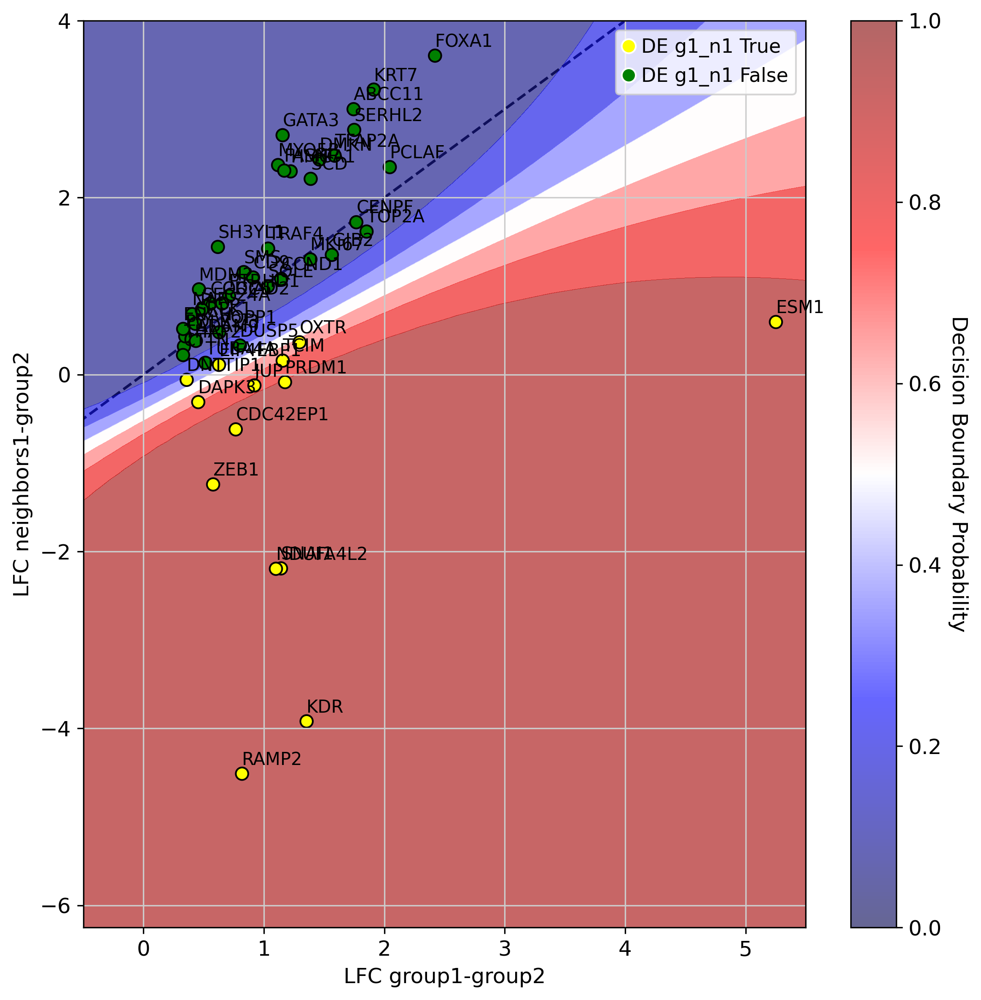

In [37]:
# g1_g3_genes = DE_1_3.g1_g2[
#     (DE_1_3.g1_g2["lfc_median"] > 0) & DE_1_3.g1_g2[f"is_de_fdr_{FDR}"]
# ].index

from params import setup

g1_g3_genes = DE_1_3.g1_g2[
    (DE_1_3.g1_g2["lfc_median"] > 0) & (DE_1_3.g1_g2["proba_de"] > PROBA_TRES)
].index

ic(g1_markers.loc[g1_g3_genes].sum())
ic(len(g1_g3_genes) - g1_markers.loc[g1_g3_genes].sum())
DE_1_3.plot(
    filter=g1_g3_genes,
    # path_to_save=f"{setup.FIGURES_2DE_FOLDER}scatter_DE_xenium.svg",
    margin=PLOT_MARGIN,
    manual_limits=(-0.5, 5.5, -6.25, 4)
)

In [40]:
DE_1_3.g1_g2[
    g1_markers
    & (DE_1_3.g1_g2["lfc_median"] > 0)
    & (DE_1_3.g1_g2["proba_de"] > PROBA_TRES)
    & (DE_1_3.g1_g2["proba_de_g1_n1"] > 0.9)
][["lfc_median", f"is_de_fdr_{FDR}", "proba_de", "proba_de_g1_n1"]].sort_values(
    by="lfc_median", ascending=False
).index


Index(['ESM1', 'KDR', 'PRDM1', 'SNAI1', 'NDUFA4L2', 'RAMP2', 'CDC42EP1',
       'ZEB1'],
      dtype='object')

In [41]:
DE_1_3.gpc.confident_genes

Index(['ESM1', 'TCIM', 'CDC42EP1', 'KDR', 'DNTTIP1', 'PRDM1', 'EIF4EBP1',
       'SNAI1', 'NDUFA4L2', 'JUP', 'DAPK3', 'ZEB1', 'RAMP2', 'OXTR'],
      dtype='object')

In [66]:
yellow_genes_g1_g2 = DE_1_3.gpc.confident_genes
blue_genes_g1_g2 = list(set(g1_g3_genes) - set(yellow_genes_g1_g2))

In [67]:
g1_g3_genes

Index(['SQLE', 'ESM1', 'CCDC6', 'PTRHD1', 'CCND1', 'PCLAF', 'TCIM', 'TRAF4',
       'SMS', 'HMGA1', 'FOXA1', 'NARS', 'CDC42EP1', 'CENPF', 'THAP2', 'KDR',
       'POLR2J3', 'KRT7', 'SERHL2', 'SRPK1', 'TOP2A', 'DNTTIP1', 'DMKN',
       'VOPP1', 'TUBA4A', 'PRDM1', 'ADAM9', 'ABCC11', 'MYO5B', 'MKI67', 'SCD',
       'EIF4EBP1', 'SNAI1', 'TFAP2A', 'SH3YL1', 'JUP', 'CTTN', 'DAPK3',
       'NDUFA4L2', 'OCIAD2', 'ZEB1', 'DUSP5', 'CD9', 'SEC24A', 'MDM2', 'OXTR',
       'GATA3', 'GJB2', 'RAMP2', 'FASN', 'ENAH'],
      dtype='object')

In [42]:
def get_gene_percentiles_list(adata, gene_list, p, layer=None):
    """
    Calculate the p-percentile of gene expression for a list of genes in an AnnData object.

    Parameters:
        adata (AnnData): The AnnData object containing expression data.
        gene_list (list): List of gene names for which to compute percentiles.
        p (float): Percentile to compute (between 0 and 100).
        layer (str or None): The layer from which to retrieve expression data.
                             If None, uses `adata.X`.

    Returns:
        list: A list of p-percentile values for the genes, in the same order as gene_list.
              If a gene is not found, its value will be `None`.
    """
    percentiles = []

    for gene in gene_list:
        if gene in adata.var_names:
            if layer:
                data = adata[:, gene].layers[layer].flatten()
            else:
                data = adata[:, gene].X.flatten()

            # Compute the percentile
            percentiles.append(np.percentile(data, p))
        else:
            percentiles.append(None)  # Handle genes not in adata.var_names

    return percentiles

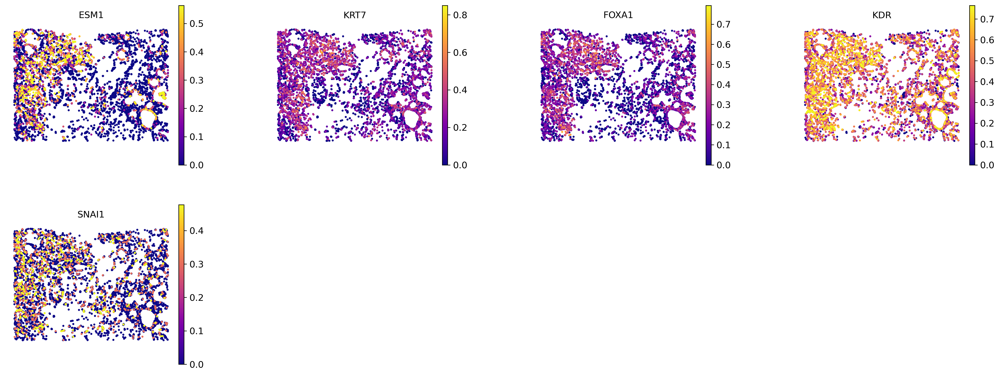

In [18]:
plot_endo = True
gene_list_invasive = ["ESM1",
            "KRT7",
            "FOXA1",
            "KDR",
            "SNAI1",
]
percentiles_invasive = get_gene_percentiles_list(
    adata, gene_list_invasive, 99.9, layer="min_max_scaled"
)

for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata=adata_astro[adata_astro.obs[setup.SAMPLE] == sample]
        if plot_endo
        else adata_not_endo[adata_not_endo.obs[setup.SAMPLE] == sample],
        spot_size=100 if plot_endo else 40,
        # color=g3_g1_genes,
        color=gene_list_invasive,
        frameon=False,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmax=percentiles_invasive,
        # vmax="p99.5",
        layer="min_max_scaled",
        cmap="plasma",
    )

    if plot_endo:
        plt.savefig(f"{figure_dir}_xenium_endo.svg", bbox_inches="tight", dpi=1000)
    else:
        plt.savefig(f"{figure_dir}_xenium_not_endo.svg", bbox_inches="tight", dpi=1000)

## DE_3_1 analysis

In [43]:
DE_3_1.g1_g2[(DE_3_1.g1_g2["lfc_median"] > 0) & DE_3_1.g1_g2[f"is_de_fdr_{FDR}"]][
    ["lfc_median", "proba_de", "proba_de_g1_n1"]
].sort_values(by="lfc_median", ascending=False)

,lfc_median,proba_de,proba_de_g1_n1
ADH1B,4.487083,0.89064,0.137829
ADIPOQ,3.196832,0.76512,0.053663
PTGDS,2.455577,0.88694,0.018452
SFRP1,2.214055,0.88051,0.009117
EDN1,2.142783,0.84436,0.999180
LEP,2.024506,0.75993,0.013651
MS4A1,2.011446,0.74159,0.007656
NCAM1,1.959141,0.80493,0.751943
MRC1,1.885683,0.78292,0.005320
CD163,1.805877,0.79013,0.003880


In [61]:
g3_g1_genes

Index(['ADH1B', 'PTGDS', 'SFRP1', 'AKR1C3', 'PDK4', 'EDN1', 'CSF3', 'CTH',
       'ANKRD29', 'CCDC80', 'FGL2', 'DPT', 'MMP12', 'CLDN5', 'AKR1C1',
       'CAVIN2', 'FBLN1', 'IL2RA', 'CD14', 'NCAM1', 'IGF1', 'C1QA', 'PGR',
       'KRT23', 'PIGR', 'CD163', 'PDCD1LG2', 'MRC1', 'GZMK', 'ALDH1A3',
       'CXCL12', 'CD79A', 'FCER1A', 'OPRPN', 'UCP1', 'TRIB1', 'ADIPOQ', 'DSC2',
       'KRT5', 'BANK1', 'LEP', 'KRT6B', 'MEDAG', 'EGFR', 'GNLY', 'CTSG',
       'SERPINA3'],
      dtype='object')

ic| g2_markers.loc[g3_g1_genes].sum(): 6
ic| len(g3_g1_genes) - g2_markers.loc[g3_g1_genes].sum(): 38
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessClassifier was fitted with feature names
  warnings.warn(


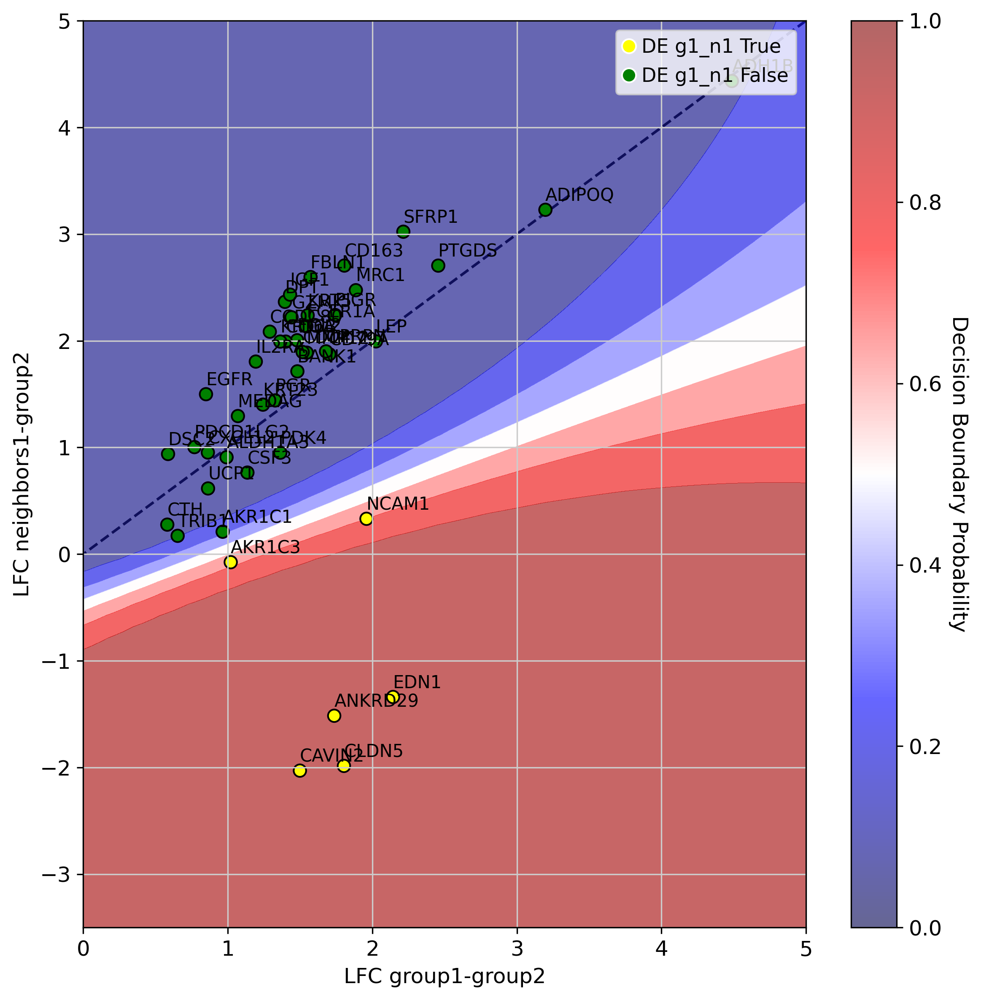

In [44]:
# g3_g1_genes = DE_3_1.g1_g2[
#     (DE_3_1.g1_g2["lfc_median"] > 0) & DE_3_1.g1_g2[f"is_de_fdr_{FDR}"]
# ].index

g3_g1_genes = DE_3_1.g1_g2[
    (DE_3_1.g1_g2["lfc_median"] > 0) & (DE_3_1.g1_g2["proba_de"] > PROBA_TRES)
].index

ic(g2_markers.loc[g3_g1_genes].sum())
ic(len(g3_g1_genes) - g2_markers.loc[g3_g1_genes].sum())

DE_3_1.plot(
    filter=g3_g1_genes,
    # path_to_save=f"{setup.FIGURES_2DE_FOLDER}scatter_DE_3_1_xenium.svg",
    margin=PLOT_MARGIN,
    manual_limits=(0, 5., -3.5, 5),
)

In [72]:
yellow_genes_g2_g1 = DE_3_1.gpc.confident_genes
blue_genes_g2_g1 = list(set(g3_g1_genes) - set(yellow_genes_g2_g1))

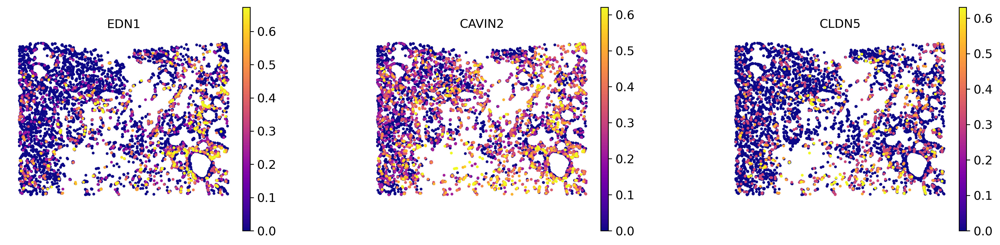

In [21]:
plot_endo = True
gene_list_stroma = ["EDN1", "CAVIN2", "CLDN5"]
percentiles_stroma = get_gene_percentiles_list(
    adata, gene_list_stroma, 99.9, layer="min_max_scaled"
)

for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata=adata_astro[adata_astro.obs[setup.SAMPLE] == sample]
        if plot_endo
        else adata_not_endo[adata_not_endo.obs[setup.SAMPLE] == sample],
        spot_size=100 if plot_endo else 40,
        # color=g3_g1_genes,
        color=gene_list_stroma,
        frameon=False,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmax=percentiles_stroma,
        # vmax="p99.5",
        layer="min_max_scaled",
        cmap="plasma",
    )

    if plot_endo:
        plt.savefig(f"{figure_dir}_xenium_stroma_endo.svg", bbox_inches="tight", dpi=1000)
    else:
        plt.savefig(f"{figure_dir}_xenium_stroma_not_endo.svg", bbox_inches="tight", dpi=1000)

In [45]:
adata_not_endo

AnnData object with n_obs × n_vars = 266152 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sample', 'cell_type', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cell_type_coarse', 'index', '_scvi_sample'
    var: 'mt', 'mean', 'std'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_coarse_colors', 'neighbors', 'pca', 'simvi_train_mask', 'simvi_val_mask', 'umap', 'log1p'
    obsm: 'X_pca', 'X_scVI', 'X_scVI_MDE', 'X_scanvi', 'X_umap', 'banksy_pc_20_lambda_0.0', 'banksy_pc_20_lambda_0.2', 'banksy_pc_20_lambda_0.5', 'ln_s10_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'ln_s20_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'neighborhood_composition', 'niche_distances', 'niche_indexes', 'qz1_m', 'qz1_m_niche_ct', 'simvi_both', 'simvi_both_08', 'simvi_both_MDE', 'simvi_both_MDE_08', 'simvi_interact', 'simvi_interact_08', 'simvi_interact_MDE', 'simvi_interact_MDE_08'